# Test the HALO Downstreaming Pipelines

## Load the library

In [1]:
from typing import Dict, Iterable, Optional
import numpy as np
import torch
from torch.distributions import Normal, Poisson
from torch.distributions import kl_divergence as kld
from torch import tensor
from complementary_models import HALOMASKVIR as HALOVI
from complementary_models import HALOMASKVAE as HALOVAE
import scanpy as sc
import scvi
import pandas as pd
from complementary_models import torch_infer_nonsta_dir
import matplotlib.pyplot as plt
import seaborn as sns

Global seed set to 0


In [2]:
path = "/mnt/data0/halo/skin/multivelo_hair.h5ad"
adata_multi = sc.read_h5ad(path)
adata_multi.obs["batch_id"] = 1
adata_multi.var["modality"] =adata_multi.var["feature_types"]
adata_mvi = scvi.data.organize_multiome_anndatas(adata_multi)
sc.pp.filter_genes(adata_mvi, min_cells=int(adata_mvi.shape[0] * 0.01))

In [3]:
HALOVI.setup_anndata(adata_mvi, batch_key="modality", time_key='latent_time')
model = HALOVI(
    adata_mvi,
    n_genes=(adata_mvi.var['modality']=='Gene Expression').sum(),
    n_regions=(adata_mvi.var['modality']=='Peaks').sum()
)

n_genes :959
n_peaks:112656
fine tune is False
gate decoder initialization n_input 10, n_output 112656,         n_hidden_local 20, n_hidden_global 128, n_cat_list [1], *cat_list 1


In [6]:

path2figdir = "figs/Hair/"
sc.settings.figdir =path2figdir
sc.set_figure_params(vector_friendly=True)


## Load pretrained model

In [7]:
model = model.load("model_hair_causal01", adata_mvi)

INFO     File model_hair_causal01/model.pt already downloaded                                
n_genes :959
fine tune is False
gate decoder initialization n_input 10, n_output 112656,         n_hidden_local 20, n_hidden_global 128, n_cat_list [1], *cat_list 1


In [8]:
latent_expr, latent_acc,latent_expr_dep, latent_atac_dep, latent_expr_indep, latent_atac_indep, times  = model.get_latent_representation()

In [9]:
adata_mvi.obs['latent_time'] = adata_mvi.obs['latent_time'].astype(float)

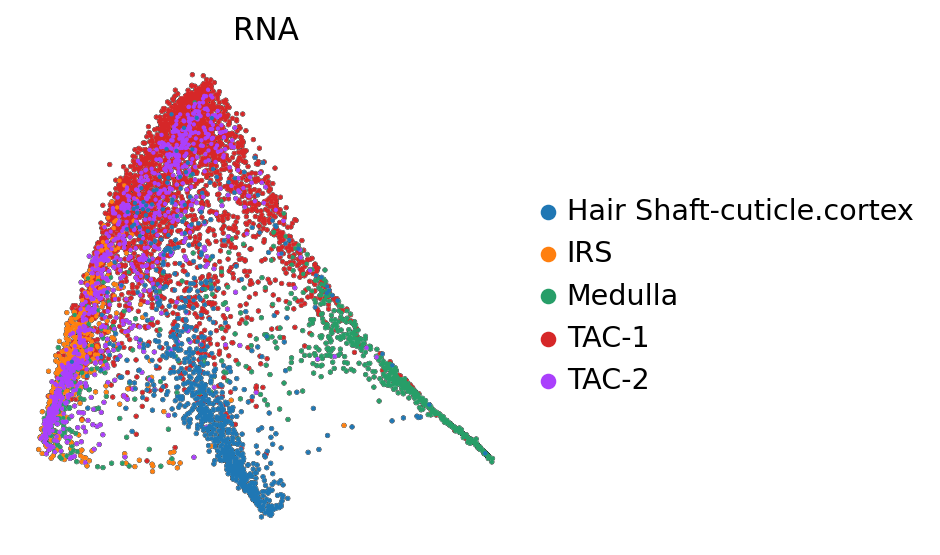

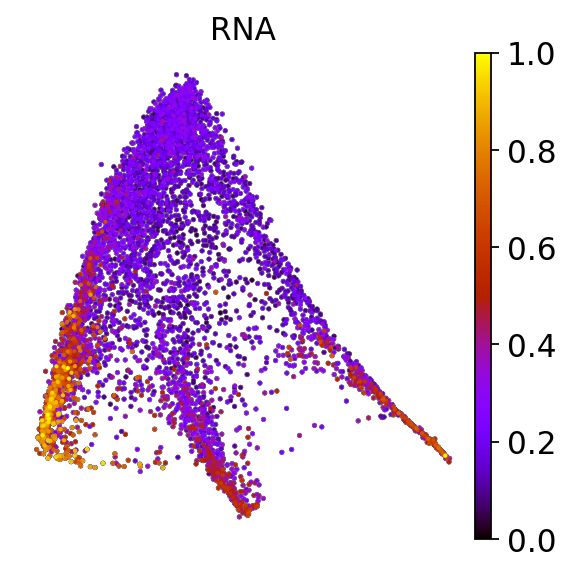

In [11]:
adata_mvi.obsm["latent"] = latent_expr

sc.pp.neighbors(adata_mvi, use_rep = 'latent',n_neighbors=15, metric = 'manhattan')
# sc.tl.umap(adata_mvi, min_dist=0.1)

sc.tl.umap(adata_mvi, min_dist=0.1, negative_sample_rate=0.1)

# sc.pl.umap(rna_data, frameon=False, size = 10, alpha = 1, add_outline=True,
#           outline_width=(0.1,0), color='leiden')
from matplotlib import pyplot as plt

path2figdir = "figs/Hair/"
sc.settings.figdir =path2figdir
figure_name = "_RNA"
format = ".pdf"
save_path = figure_name+format
# with plt.rc_context():
sc.set_figure_params(vector_friendly=True)
sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,
        outline_width=(0.1,0), color=['celltype'], title="RNA")

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,
        outline_width=(0.1,0), color=['latent_time'], title="RNA", color_map = 'gnuplot') 


# sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,
#         outline_width=(0.1,0), color=['celltype'], title="RNA", save=save_path)
# # plt.savefig(save_path, bbox_inches="tight", dpi=300)        

# figure_name = "_RNA_latenttime"
# format = ".pdf"
# save_path = figure_name+format

# sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,
#         outline_width=(0.1,0), color=['latent_time'], title="RNA", color_map = 'gnuplot',save=save_path)  
#     # plt.savefig(save_path, bbox_inches="tight",dpi=300)        


In [12]:
### test TF enrichement of with the umap


In [27]:
latent_expr[:,0].shape

(6436,)

In [28]:
latent_expr[:,0].reshape(1,-1).shape

(1, 6436)

In [29]:
## enrichment of the latent factors
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()

for i in range(10):
    adata_mvi.obs["epxr_latent_"+str(i)] = min_max_scaler.fit_transform(latent_expr[:,i].reshape(1,-1))[0,:]

for i in range(10):
    adata_mvi.obs["atac_latent_"+str(i)] =  min_max_scaler.fit_transform(latent_acc[:,i].reshape(1,-1))[0,:]

In [36]:
for i in range(10):
    adata_mvi.obs["epxr_latent_"+str(i)] = latent_expr[:,i]

for i in range(10):
    adata_mvi.obs["atac_latent_"+str(i)] =  latent_acc[:,i]

In [285]:
latentname = ["epxr_latent_"+str(i) for i in range(10)]


In [ ]:
latentname = ["epxr_latent_"+str(i) for i in range(10)]

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,
          outline_width=(0.1,0), color=latentname,color_map = 'magma')   

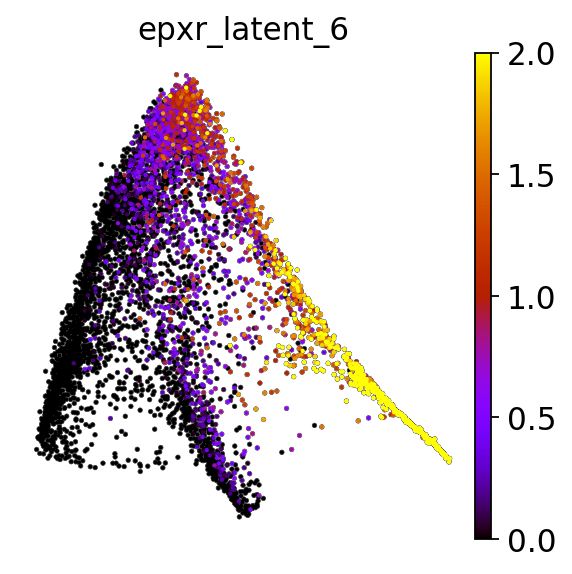

In [269]:
figure_name = "_expr_latent_6"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,          outline_width=(0.1,0), color=latentname[6],color_map = 'gnuplot',vmin=0, vmax=2, save=save_path)   

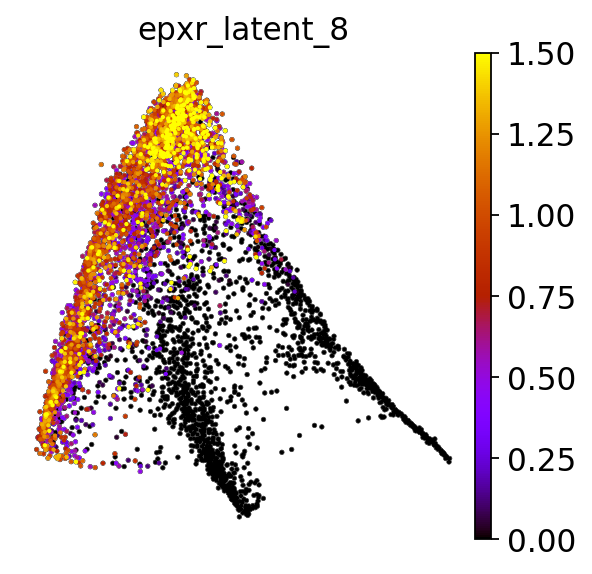

In [287]:
figure_name = "_expr_latent_8"
format = ".pdf"
save_path = figure_name+format


sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,
          outline_width=(0.1,0), color=latentname[8],color_map = 'gnuplot',vmin=0, vmax=1.5,save=save_path)   

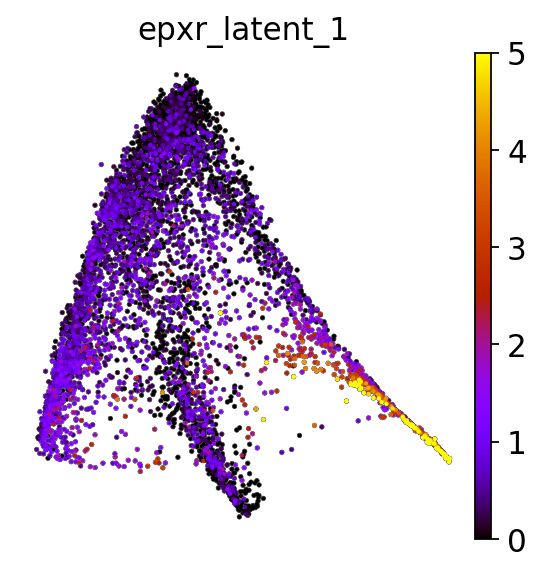

In [272]:
figure_name = "_expr_latent_1"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,
          outline_width=(0.1,0), color=latentname[1],color_map = 'gnuplot',vmin=0, vmax=5, save=save_path)   

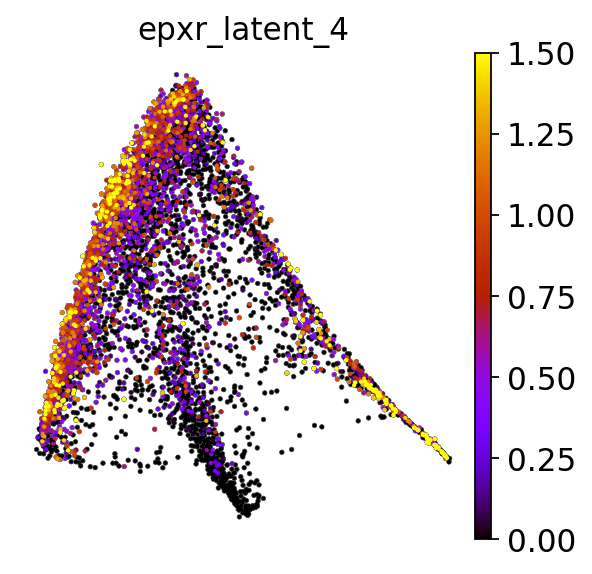

In [277]:
figure_name = "_expr_latent_4"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,
          outline_width=(0.1,0), color=latentname[4],color_map = 'gnuplot', vmin=0, vmax=1.5, save=save_path)  

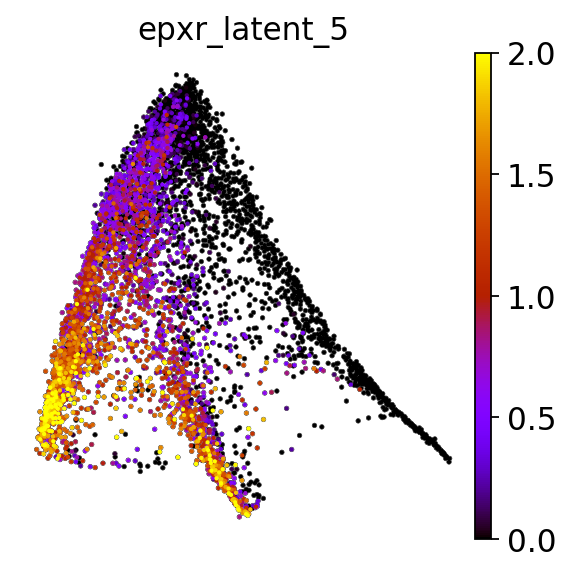

In [290]:
figure_name = "_expr_latent_5"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,
          outline_width=(0.1,0), color=latentname[5],color_map = 'gnuplot', vmin=0, vmax=2,save=save_path)  

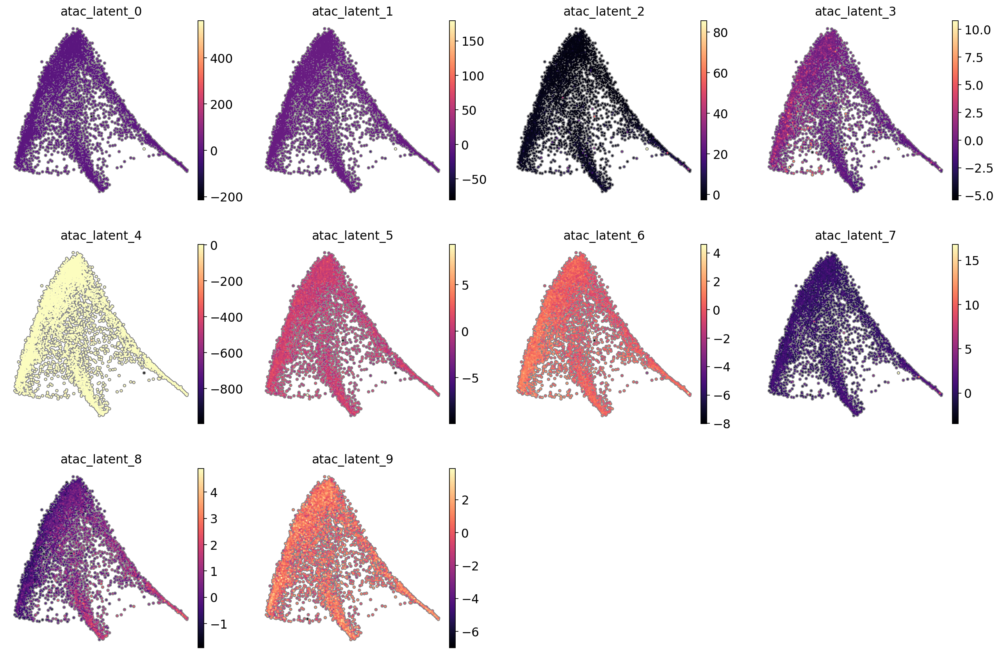

In [278]:
latentname = ["atac_latent_"+str(i) for i in range(10)]

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,
          outline_width=(0.5,0),  outline_color=('grey', 'white'), color=latentname,color_map = 'magma')  

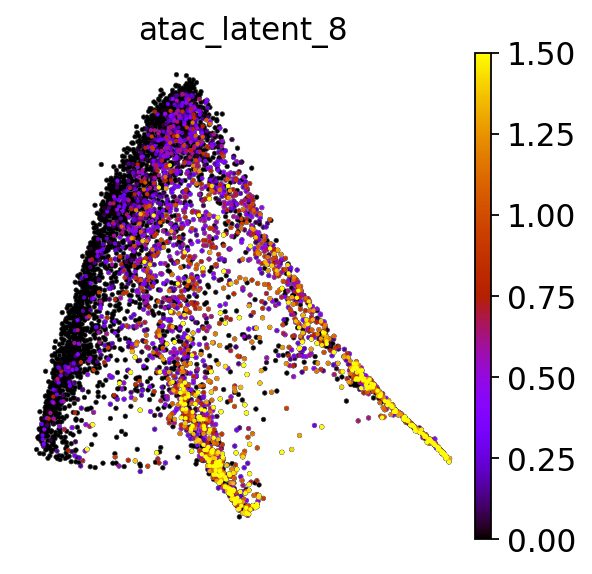

In [279]:
atac_latentname = ["atac_latent_"+str(i) for i in range(10)]
figure_name = "_atac_latent_8"
format = ".pdf"
save_path = figure_name+format
sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,
          outline_width=(0.1,0), color=atac_latentname[8],color_map = 'gnuplot', vmin=0, vmax=1.5, save=save_path)  

In [130]:
adata_mvi.obs.atac_latent_7.quantile([0.25,0.5,0.75])

0.25   -0.523395
0.50   -0.061183
0.75    0.446223
Name: atac_latent_7, dtype: float64

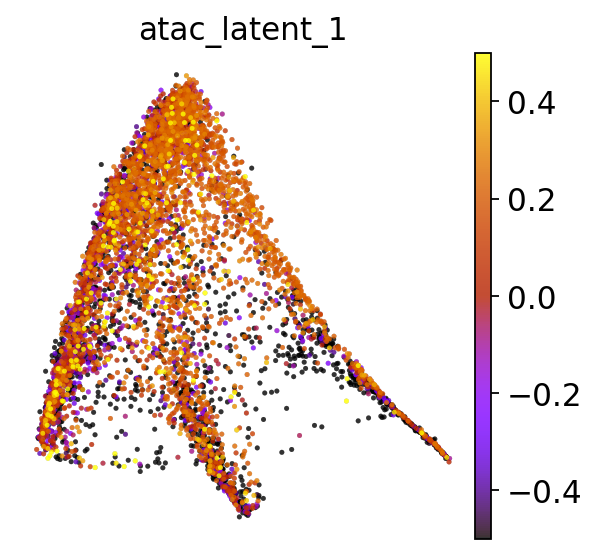

In [280]:

figure_name = "_atac_latent_1"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 20, alpha = 0.8, add_outline=True,
          outline_width=(0,0), outline_color=("gray", "white"), color=atac_latentname[1],color_map = 'gnuplot', vmin=-0.5, vmax=0.5, save=save_path) 

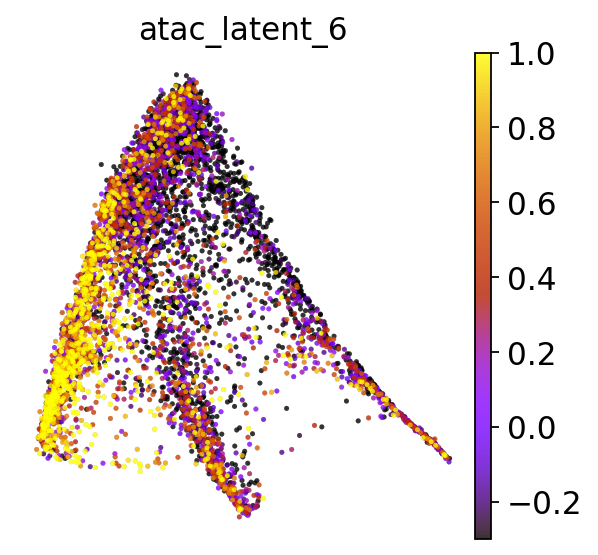

In [281]:

figure_name = "_atac_latent_6"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 20, alpha = 0.8, add_outline=True,
          outline_width=(0,0), outline_color=("gray", "white"), color=atac_latentname[6],color_map = 'gnuplot', vmin=-0.3, vmax=1, save=save_path) 

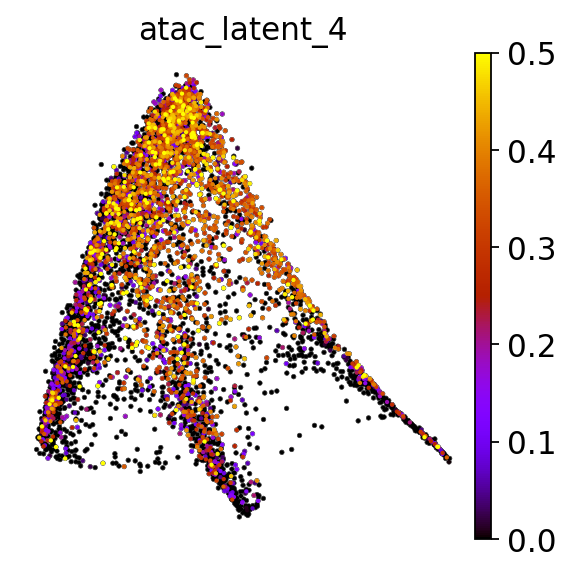

In [282]:

figure_name = "_atac_latent_4"
format = ".pdf"
save_path = figure_name+format
sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,
          outline_width=(0.1,0), color=atac_latentname[4],color_map = 'gnuplot', vmin=-0, vmax=0.5, save=save_path) 

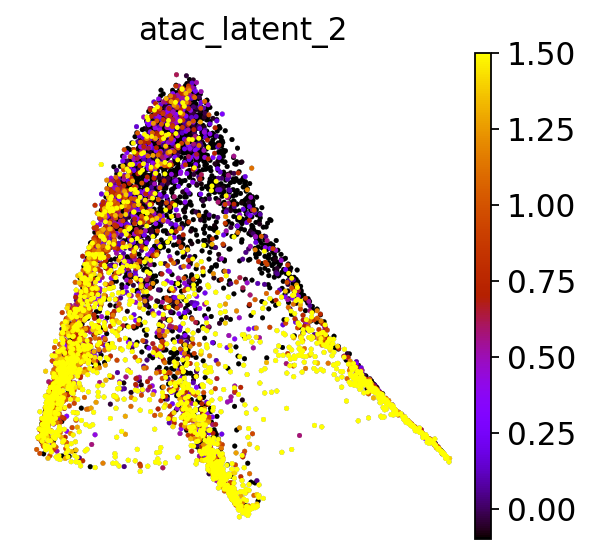

In [283]:
figure_name = "_atac_latent_2"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 20, alpha = 1, add_outline=True,
          outline_width=(0.,0), color=atac_latentname[2],color_map = 'gnuplot', vmin=-0.1, vmax=1.5, save=save_path)  

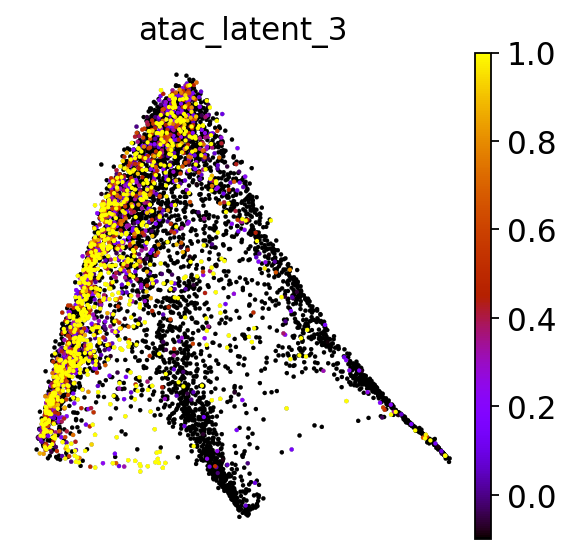

In [288]:

figure_name = "_atac_latent_3"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,
          outline_width=(0.0,0), color=atac_latentname[3],color_map = 'gnuplot', vmin=-0.1, vmax=1, save=save_path)  

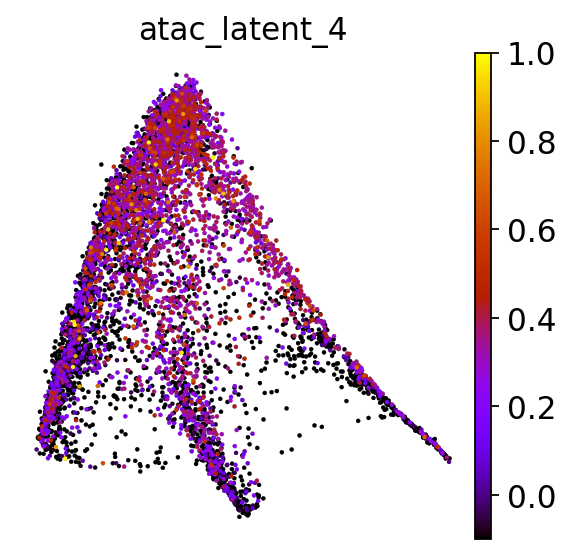

In [289]:
figure_name = "_atac_latent_4"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,
          outline_width=(0.0,0), color=atac_latentname[4],color_map = 'gnuplot', vmin=-0.1, vmax=1, save=save_path) 

<AxesSubplot:xlabel='atac_latent_0', ylabel='Count'>

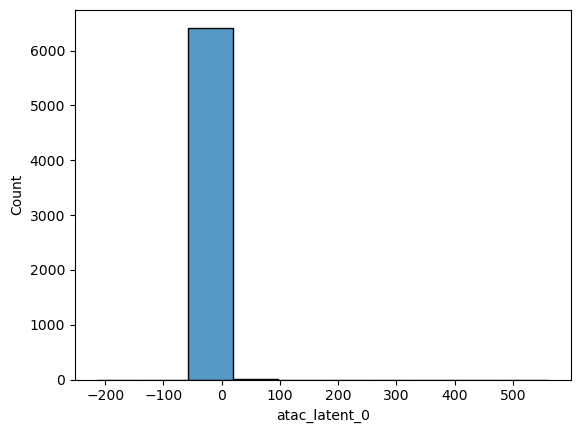

In [64]:
import seaborn as sns

sns.histplot(data=adata_mvi.obs, x="atac_latent_0", bins=10)

In [141]:
from complementary_models import split_rna,split_atac
rna_data = split_rna(adata_mvi=adata_mvi)
atac_data = split_atac(adata_mvi)

### get the loading matrix

In [10]:
rnaloading = model.get_rna_loading()
rnaloading = rnaloading.T

[Text(0.5, 14.722222222222216, 'genes')]

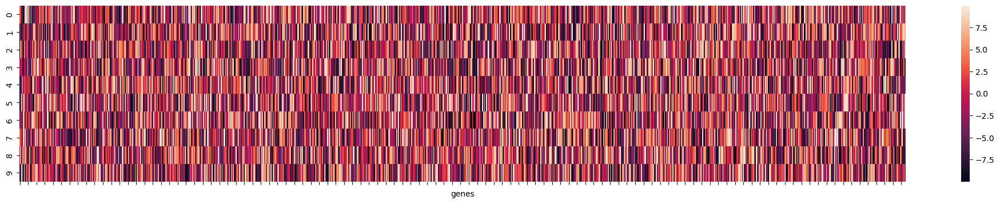

In [144]:
plt.figure(figsize=(25,4))
hm = sns.heatmap(rnaloading)
hm.set(xticklabels=[]) 
hm.set(xlabel="genes")

In [6]:
## get RNA data
from complementary_models import split_rna
rna_data = split_rna(adata_mvi=adata_mvi)

In [5]:
## read the RNA data

rna_data = sc.read_h5ad("data/datasets/mouse_hair_r.h5ad")

In [8]:
latent_expr.shape

(3365, 10)

In [9]:
## save the latent representations
for i in range(10):
    latent_name = "latent_"+str(i)
    rna_data.obs[latent_name] = latent_expr[:, i]
    print(latent_name),



latent_0
latent_1
latent_2
latent_3
latent_4
latent_5
latent_6
latent_7
latent_8
latent_9


In [10]:
## save the data

rna_data.write_h5ad("data/datasets/mouse_brain_rna_interim2.h5ad")

### get the highly variable genes

In [11]:
## you can also read the data if you save it

rna_data = sc.read_h5ad("data/datasets/mouse_hair_rna_interim.h5ad")

In [145]:
sc.pp.filter_genes(rna_data, min_cells=15)
rna_data.raw = rna_data
## normlaize the read depths of each cell, then logarithmize the data:
sc.pp.normalize_total(rna_data, target_sum=1e4)
sc.pp.log1p(rna_data)
# Calculate highly variable genes, but with a less stringent dispersion threshold. This set of genes will be our “exogenous” genes:
sc.pp.highly_variable_genes(rna_data, min_disp = 0.2, n_top_genes=None)
rna_data.var['exog'] = rna_data.var.highly_variable.copy()
# Finally, calculate the “endogenous” geneset by intersecting the exogenous set with genes with a higher dispersion threshold:
rna_data.var['endog'] = rna_data.var.exog & (rna_data.var.dispersions_norm > 0.7)
# Restore the raw counts to the counts layer.
rna_data.layers['counts'] = rna_data.raw.to_adata().X.copy()


In [175]:
## add the latent features of model
rna_data.obsm["X_topic_compositions"] = latent_expr
rna_data.obsm["X_umap"] = latent_expr

In [25]:
rna_data.var = rna_data.var.reset_index()
rna_data.var

,index,feature_types,modality,n_cells,highly_variable,means,dispersions,dispersions_norm,exog,endog
0,1700025G04Rik,Gene Expression,Gene Expression,1177,False,2.535499,4.398642,0.056588,False,False
1,2610507B11Rik,Gene Expression,Gene Expression,876,False,2.112825,4.291477,-0.596205,False,False
2,4833420G17Rik,Gene Expression,Gene Expression,648,False,1.849404,4.241606,-0.847347,False,False
3,5031439G07Rik,Gene Expression,Gene Expression,368,False,1.364747,4.306948,-0.215351,False,False
4,9930021J03Rik,Gene Expression,Gene Expression,787,False,2.047196,4.364122,0.098936,False,False
...,...,...,...,...,...,...,...,...,...,...
954,Znhit6,Gene Expression,Gene Expression,418,False,1.456709,4.282283,-0.593214,False,False
955,Znrf1,Gene Expression,Gene Expression,1092,False,2.326576,4.282798,-0.662185,False,False
956,Zranb3,Gene Expression,Gene Expression,309,False,1.289990,4.323316,-0.054443,False,False
957,Zswim6,Gene Expression,Gene Expression,1559,False,2.776563,4.329644,-0.338139,False,False


### get the top genes

In [26]:
topgenes_latent_1 = model.get_top_genes(300, loadingmatrix=rnaloading, latent_index=2, rnadata =rna_data,colname="index") # gene names are saved as the adata.var index

In [27]:
rna_data.var

,index,feature_types,modality,n_cells,highly_variable,means,dispersions,dispersions_norm,exog,endog
0,1700025G04Rik,Gene Expression,Gene Expression,1177,False,2.535499,4.398642,0.056588,False,False
1,2610507B11Rik,Gene Expression,Gene Expression,876,False,2.112825,4.291477,-0.596205,False,False
2,4833420G17Rik,Gene Expression,Gene Expression,648,False,1.849404,4.241606,-0.847347,False,False
3,5031439G07Rik,Gene Expression,Gene Expression,368,False,1.364747,4.306948,-0.215351,False,False
4,9930021J03Rik,Gene Expression,Gene Expression,787,False,2.047196,4.364122,0.098936,False,False
...,...,...,...,...,...,...,...,...,...,...
954,Znhit6,Gene Expression,Gene Expression,418,False,1.456709,4.282283,-0.593214,False,False
955,Znrf1,Gene Expression,Gene Expression,1092,False,2.326576,4.282798,-0.662185,False,False
956,Zranb3,Gene Expression,Gene Expression,309,False,1.289990,4.323316,-0.054443,False,False
957,Zswim6,Gene Expression,Gene Expression,1559,False,2.776563,4.329644,-0.338139,False,False


In [28]:
rna_data.var = rna_data.var.set_index("index")
for e in rna_data.var.iloc[topgenes_latent_1, :].index.tolist():
     print(e)

Tfap2a
Exoc6
Pi4k2a
Mbip
Tenm4
Fam126b
Appl1
Slc39a10
Rpl26
Cpt1a
Cers3
Gna12
Areg
Frmd4a
Vwa8
Tgm6
Brd7
Hmbox1
Cep290
Farp2
Dnmt3a
Clk2
Cdkal1
Nmt2
Prr14l
Rnf34
Cep162
Itga6
Cnot3
Ebf1
Ednra
Galnt3
St8sia6
Slc16a10
Cenpc1
Atf3
Tead3
Smc2
Rsrc1
Poldip3
Fmr1
Id3
Ltbp1
Ctif
Phactr4
Krt73
Cep164
Krt28
Ubtf
Ctdspl2
BC005561
Tnfaip3
Ndfip2
Camk2d
Pitrm1
Cpsf3
Zfp692
Ssrp1
Xdh
Topbp1
Abcf2
Pex7
Adarb1
Acvr1b
Shq1
Hadh
Fam133b
Lrrfip2
Agtpbp1
Agl
Smpd3
Dcun1d4
Slc39a14
Ppp1r12b
Prpf3
Sdad1
Mcm9
Ppfibp2
Tenm2
Sart3
Tank
Pcca
Slc7a6
Vat1l
Ptcd3
Vps33b
Dnajc2
Pla2g4f
Mpdz
Pdss2
Rora
Sfxn1
Ddx42
Cdc42bpg
Rnf10
Helq
Coq2
Pinx1
Smurf2
Scaf8
Setd1a
Smg6
Maml3
Cdh6
Fgfr2
Dctn4
Man1b1
Dtnb
Krt35
Immp2l
Wnt3
Zranb3
Anxa1
2610507B11Rik
Klhl7
Tmtc1
Braf
Dna2
Ift80
Sema4b
Klhl24
Mt1
Timp3
Fam98b
Golga4
Macrod2
Rbbp8
Aff3
Ndufs4
Fbrsl1
Mef2d
Gnl3
Padi1
Heg1
Prim2
Mecp2
Mia3
Cd82
Dusp16
Pitpnc1
Kctd3
Sergef
Magi3
Nsmaf
Zgrf1
Kif11
Gripap1
Runx1
Cdc37l1
Med12
Atad2b
Safb2
Myh14
Vps37b
Trp53bp2
Brca2
Shoc2
Si

In [33]:
def raw_umap(
            ncols = 8,
            frameon=False, 
            color_map = 'Blues', 
            add_outline = True, 
            outline_color = ('black','lightgrey'), 
            outline_width = (0, 0.5), 
            size = 30):

    return dict(
        ncols = ncols, frameon = frameon, color_map = color_map,
        add_outline = add_outline, outline_color = outline_color, 
        outline_width = outline_width, size = size
    )


In [34]:
sc.pp.neighbors(rna_data, use_rep = 'X_umap',n_neighbors=15, metric = 'manhattan')
sc.tl.umap(rna_data, min_dist=0.1, negative_sample_rate=0.1)


In [59]:
sub = rna_data.var.iloc[topgenes_latent_8, :]
sub[sub.highly_variable == True]

,feature_types,modality,n_cells,highly_variable,means,dispersions,dispersions_norm,exog,endog
index,,,,,,,,,
Cenpf,Gene Expression,Gene Expression,1238,True,2.720288,4.612706,1.572503,True,True
Tgm6,Gene Expression,Gene Expression,266,True,1.314128,4.602503,2.690259,True,True
Ctsc,Gene Expression,Gene Expression,569,True,1.920232,4.624325,2.108683,True,True
Lrp5,Gene Expression,Gene Expression,747,True,1.994917,4.394318,0.332164,True,False
Padi4,Gene Expression,Gene Expression,459,True,1.760856,4.674111,2.493217,True,True
Csrp1,Gene Expression,Gene Expression,444,True,1.612204,4.514517,2.048346,True,True
Slc44a2,Gene Expression,Gene Expression,430,True,1.508388,4.379955,0.517765,True,False
Frmd4a,Gene Expression,Gene Expression,981,True,2.328407,4.409700,0.302493,True,False
Ppl,Gene Expression,Gene Expression,1347,True,2.649838,4.428500,0.268031,True,False


In [60]:
latent_genes = sub[sub.highly_variable == True].index.tolist()

In [61]:
len(latent_genes)

49

In [62]:
# latent_genes_selected = ["Irx2","Mical2", "Slbp", "Rnd3", "Hephl1"]
# [1, 5, 7, 9, 10]
figure_name = "_RNA_latent_8_topgenes"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(rna_data, color=latent_genes, **raw_umap(ncols=6, size=75, color_map="Blues", outline_width=(0, 0.5)),vmax=2, save=save_path,show=False, colorbar_loc=None) 

[<AxesSubplot:title={'center':'Cenpf'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Tgm6'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Ctsc'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Lrp5'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Padi4'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Csrp1'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Slc44a2'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Frmd4a'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Ppl'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Reep5'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Tiam2'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Ptch1'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Ust'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Aldh1a3'}, xlabel='UMAP1

In [63]:
latent8_genes_selected = ["Ctsc", "Frmd4a", "Arhgap29", 'Krt27']
figure_name = "_RNA_latent_8_topgenes_selected"
format = ".pdf"
save_path = figure_name+format
sc.pl.umap(rna_data, color=latent8_genes_selected, **raw_umap(ncols=4, size=75, color_map="Blues", outline_width=(0, 0.5)),vmax=2, save=save_path,show=False, colorbar_loc=None) 

[<AxesSubplot:title={'center':'Ctsc'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Frmd4a'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Arhgap29'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Krt27'}, xlabel='UMAP1', ylabel='UMAP2'>]

In [48]:
latent1_genes_selected = ["Soat1", "Slc24a3", "Itgav", 'Skil']
figure_name = "_RNA_latent_1_topgenes_selected"
format = ".pdf"
save_path = figure_name+format
sc.pl.umap(rna_data, color=latent1_genes_selected, **raw_umap(ncols=5, size=75, color_map="Blues", outline_width=(0, 0.5)),vmax=2, save=save_path,show=False, colorbar_loc=None) 

[<AxesSubplot:title={'center':'Soat1'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Slc24a3'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Itgav'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Skil'}, xlabel='UMAP1', ylabel='UMAP2'>]

In [314]:
latent_genes_selected = ["Irx2","Mical2", "Slbp", "Rnd3", "Hephl1"]
# [1, 5, 7, 9, 10]
figure_name = "_RNA_latent_5_topgenes_selected"
format = ".pdf"
save_path = figure_name+format

sc.pl.umap(rna_data, color=latent_genes_selected, **raw_umap(ncols=5, size=75, color_map="Blues", outline_width=(0, 0.5)),vmax=2, save=save_path,show=False, colorbar_loc=None) 

[<AxesSubplot:title={'center':'Irx2'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Mical2'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Slbp'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Rnd3'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Hephl1'}, xlabel='UMAP1', ylabel='UMAP2'>]

In [353]:
## save the data
rna_data.write_h5ad("data/datasets/mouse_hair_rna_interim.h5ad")

In [339]:
## split the atac data
from complementary_models import split_atac, reindex_atac

atac_data = split_atac(adata_mvi=adata_mvi)
# atac_data = reindex_atac(atac_data)

In [346]:
atac_data.var.index.names = ["Id"]
atac_data.var.index = atac_data.var.index.astype(str)
atac_data.var

,feature_types,modality,n_cells
Id,,,
0,Peaks,Peaks,4078
1,Peaks,Peaks,4088
2,Peaks,Peaks,2032
3,Peaks,Peaks,2082
4,Peaks,Peaks,1850
...,...,...,...
344411,Peaks,Peaks,73
344496,Peaks,Peaks,78
344514,Peaks,Peaks,94


In [345]:
atac_var = pd.read_csv("/mnt/data0/halo/skin/skin_peaks.bed.gz", delimiter="\t", header=None)
atac_var.index.names = ['Id']
atac_var.index = atac_var.index.astype(str)


In [347]:
atac_data.var = pd.merge(atac_data.var, atac_var, how="left",left_on="Id", right_on="Id")
atac_data.var

,feature_types,modality,n_cells,0,1,2
Id,,,,,,
0,Peaks,Peaks,4078,chrX,143482906,143483206
1,Peaks,Peaks,4088,chr6,3200976,3201276
2,Peaks,Peaks,2032,chr9,123461850,123462150
3,Peaks,Peaks,2082,chr1,56782095,56782395
4,Peaks,Peaks,1850,chr9,56223668,56223968
...,...,...,...,...,...,...
344411,Peaks,Peaks,73,chr10,81232540,81232840
344496,Peaks,Peaks,78,chr10,3862097,3862397
344514,Peaks,Peaks,94,chr10,24784301,24784601


In [348]:
atac_data.var = atac_data.var.rename(columns={0:"chr", 1:"begin", 2:"end"})
atac_data.var

,feature_types,modality,n_cells,chr,begin,end
Id,,,,,,
0,Peaks,Peaks,4078,chrX,143482906,143483206
1,Peaks,Peaks,4088,chr6,3200976,3201276
2,Peaks,Peaks,2032,chr9,123461850,123462150
3,Peaks,Peaks,2082,chr1,56782095,56782395
4,Peaks,Peaks,1850,chr9,56223668,56223968
...,...,...,...,...,...,...
344411,Peaks,Peaks,73,chr10,81232540,81232840
344496,Peaks,Peaks,78,chr10,3862097,3862397
344514,Peaks,Peaks,94,chr10,24784301,24784601


In [350]:
atac_data.var = atac_data.var.rename(columns={"begin":"start"})


In [352]:
atac_data.write_h5ad("data/datasets/mouse_hair_atac_interim.h5ad")

### Merge the atac data with the anotation


## change the virtual environment HALO2

In [1]:
import mira
import anndata
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import tools
warnings.simplefilter("ignore")

mira.datasets.PseudotimeTrajectoryInferenceTutorial()
atac_data = sc.read_h5ad("data/datasets/mouse_hair_atac_interim.h5ad")
mira.utils.pretty_sderr()


INFO:mira.datasets.datasets:Dataset already on disk.
INFO:mira.datasets.datasets:Dataset contents:
	* mira-datasets/shareseq.hair_follicle.joint_representation.h5ad


In [4]:
import tools
import logging
tools.motif_scan.logger.setLevel(logging.INFO)
tools.get_motif_hits_in_peaks(atac_data,
                    genome_fasta='mm10.fa',
                    chrom = 'chr', start = 'start', end = 'end')

INFO:tools.motif_scan:Getting peak sequences ...
112656it [00:01, 71532.32it/s]
INFO:tools.motif_scan:Scanning peaks for motif hits with p >= 0.0001 ...
INFO:tools.motif_scan:Building motif background models ...
INFO:tools.motif_scan:Starting scan ...
INFO:tools.motif_scan:Found 1000000 motif hits ...
INFO:tools.motif_scan:Formatting hits matrix ...
INFO:tools.regulators:Added key to varm: motifs_hits
INFO:tools.regulators:Added key to uns: motifs


In [5]:
atac_data.write_h5ad("data/datasets/mouse_hair_atac_interim.h5ad")

## Back to HALO environment

In [1]:
from typing import Dict, Iterable, Optional

import numpy as np
import torch
from torch.distributions import Normal, Poisson
from torch.distributions import kl_divergence as kld
from torch import tensor
from complementary_models import HALOMASKVIR as HALOVI
from complementary_models import HALOMASKVAE as HALOVAE
import scanpy as sc
import scvi

import pandas as pd

Global seed set to 0


In [2]:
path = "/mnt/data0/halo/skin/multivelo_hair.h5ad"
adata_multi = sc.read_h5ad(path)
adata_multi.obs["batch_id"] = 1
adata_multi.var["modality"] =adata_multi.var["feature_types"]
adata_mvi = scvi.data.organize_multiome_anndatas(adata_multi)
sc.pp.filter_genes(adata_mvi, min_cells=int(adata_mvi.shape[0] * 0.01))

In [3]:
HALOVI.setup_anndata(adata_mvi, batch_key="modality", time_key='latent_time')
model = HALOVI(
    adata_mvi,
    n_genes=(adata_mvi.var['modality']=='Gene Expression').sum(),
    n_regions=(adata_mvi.var['modality']=='Peaks').sum()
)

n_genes :959
fine tune is False
gate decoder initialization n_input 10, n_output 112656,         n_hidden_local 20, n_hidden_global 128, n_cat_list [1], *cat_list 1


In [4]:
model = model.load("model_hair_causal01", adata_mvi)

INFO     File model_hair_causal01/model.pt already downloaded                                
n_genes :959
fine tune is False
gate decoder initialization n_input 10, n_output 112656,         n_hidden_local 20, n_hidden_global 128, n_cat_list [1], *cat_list 1


In [20]:
loadings = model.get_atac_loading()
loadings.shape

(112656, 10)

In [21]:
atac_data = sc.read_h5ad("data/datasets/mouse_hair_atac_interim.h5ad")

In [22]:
loadings = loadings.T

In [23]:
import matplotlib.pyplot as plt

def compare_latent_TFs(l1=0, l2=5):
    latent_l1_tf, index_learnt = model.get_enriched_TFs(atac_data, topic_num=l1, top_quantile=5e-5, loadings=loadings, num_exo_features=1e6)
    latent_l2_tf, index_learnt = model.get_enriched_TFs(atac_data, topic_num=l2, top_quantile=5e-5, loadings=loadings, num_exo_features=1e6)
    model.plot_compare_topic_enrichments(l1, l2, pval_threshold=(1e-10, 1e-11), color="pink")



Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

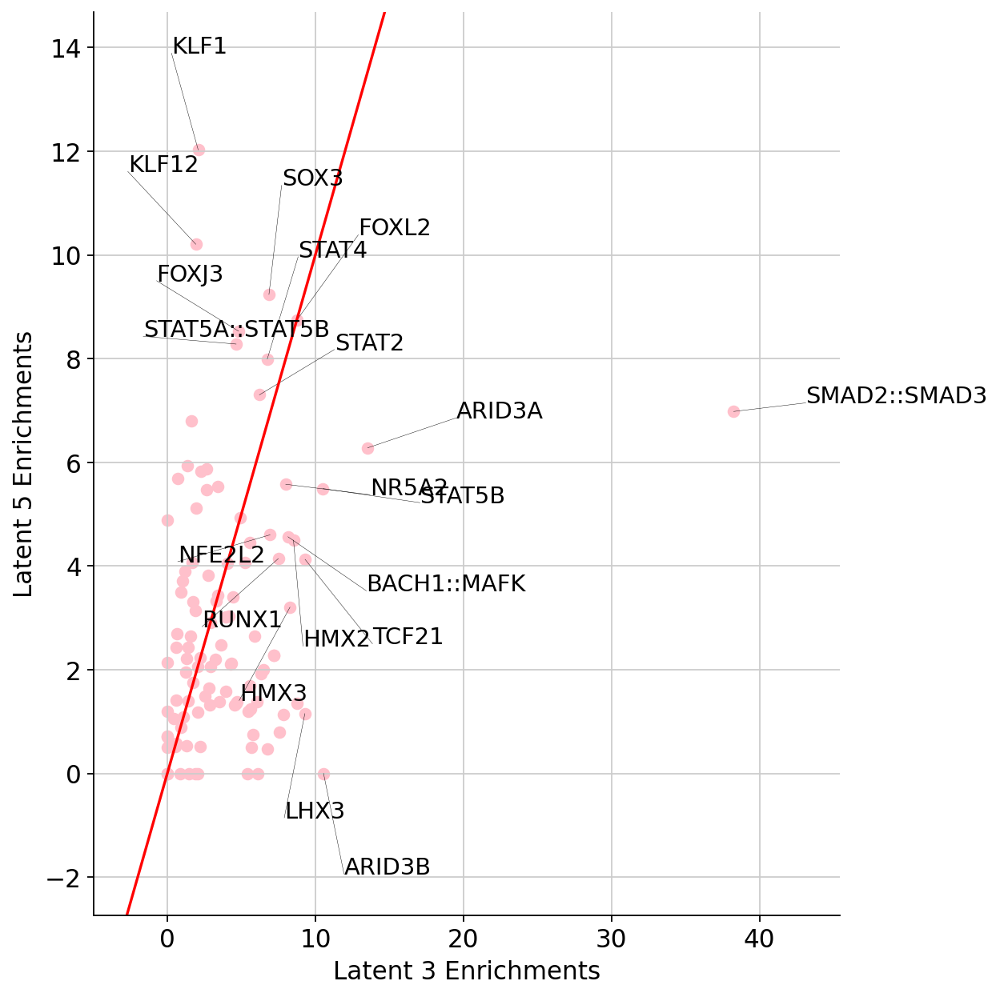

In [27]:
compare_latent_TFs(3,5)

Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

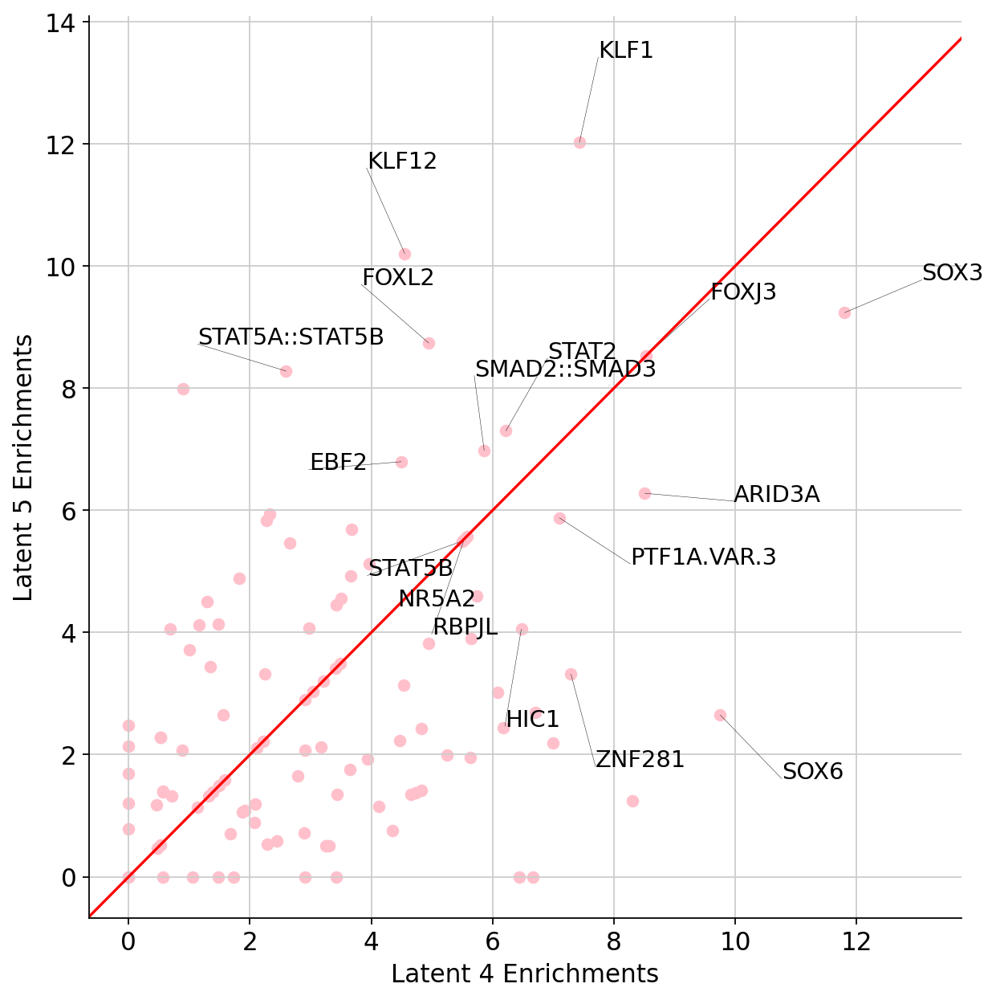

In [28]:
compare_latent_TFs(4,5)

Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

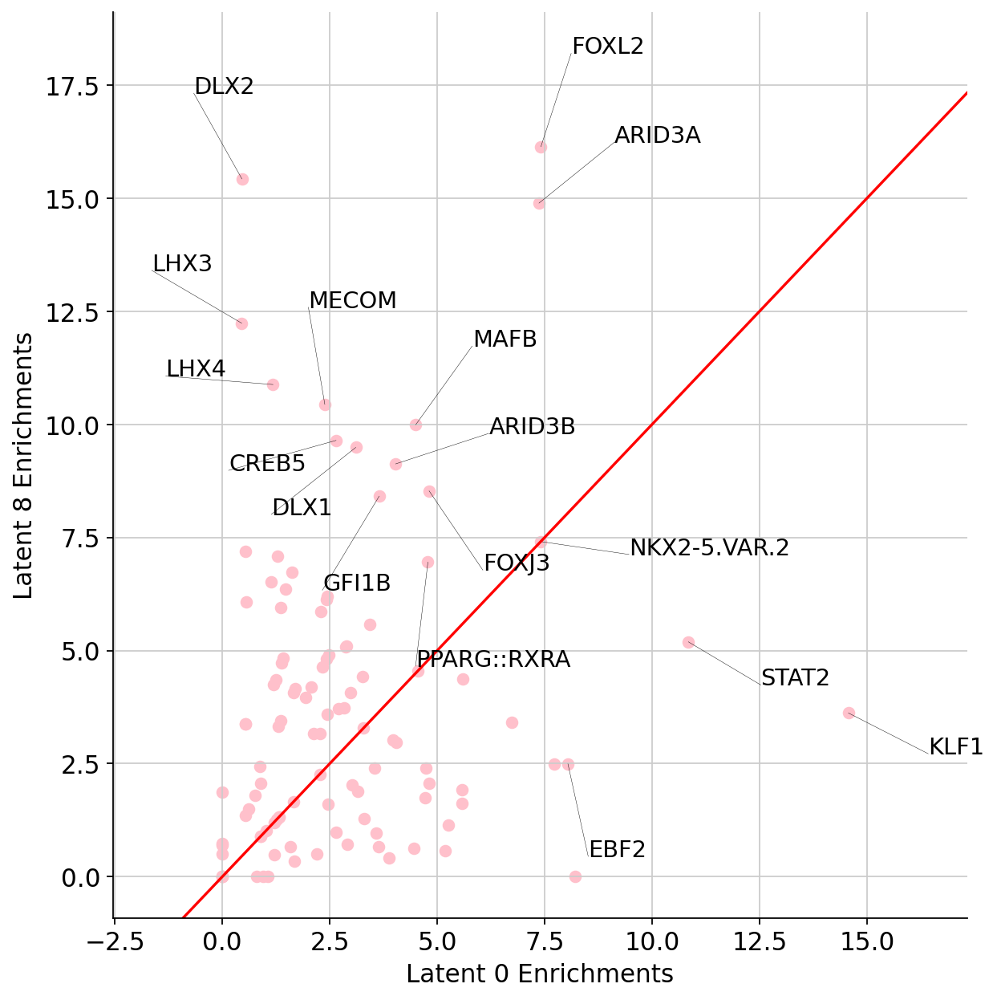

In [32]:
compare_latent_TFs(0,8)

Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

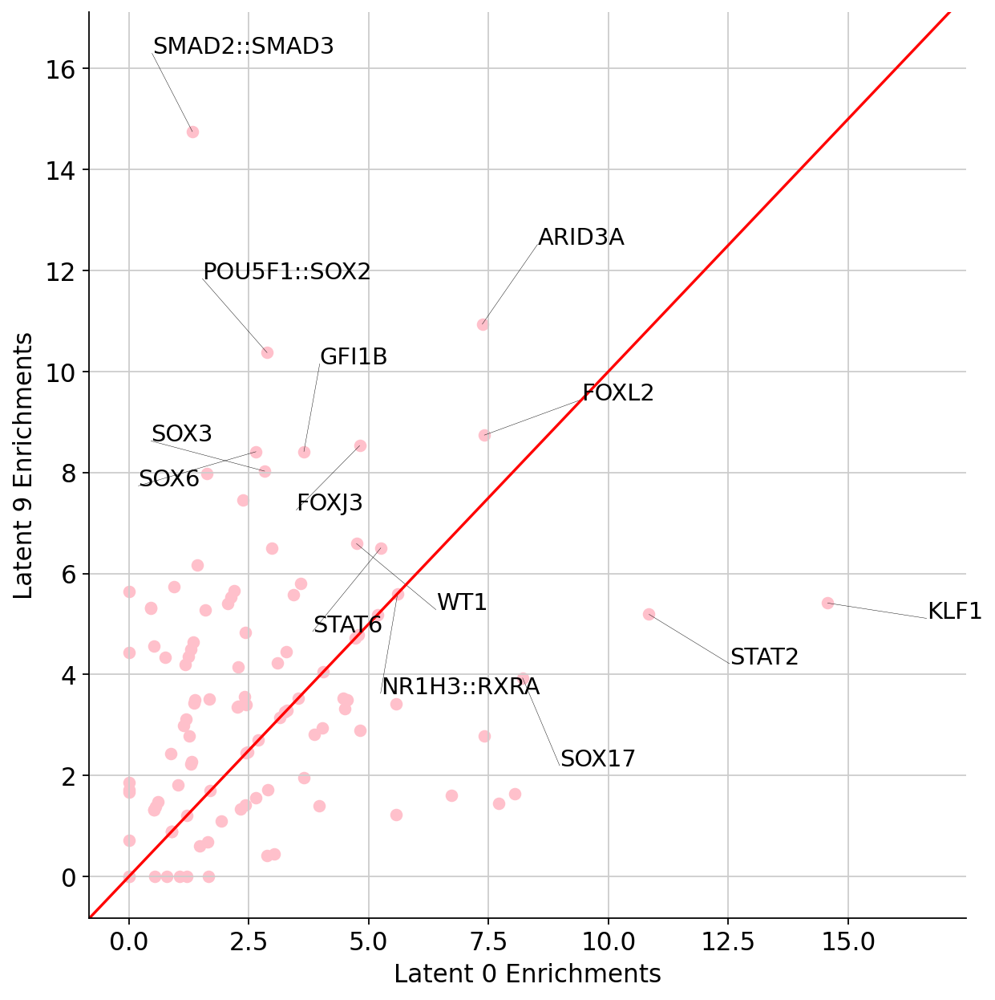

In [34]:
compare_latent_TFs(0,9)

In [8]:
# loadings = loadings.T
latent_8_tf, index_learnt = model.get_enriched_TFs(atac_data, topic_num=8, top_quantile=5e-5, loadings=loadings, num_exo_features=1e6)
latent_8_tf = pd.DataFrame(latent_8_tf)


Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

In [9]:
latent_8_tf.sort_values(by=['pval']).head(20)


,id,name,parsed_name,pval,test_statistic
72,MA1607.1,FOXL2,FOXL2,7.250741e-17,38.300738
1,MA0885.1,DLX2,DLX2,3.725765e-16,40.525180
101,MA0151.1,ARID3A,ARID3A,1.278424e-15,23.502345
38,MA0135.1,LHX3,LHX3,5.796218e-13,32.218200
19,MA0704.1,LHX4,LHX4,1.313127e-11,29.552992
33,MA0029.1,MECOM,MECOM,3.612434e-11,34.050780
3,MA0117.2,MAFB,MAFB,1.016851e-10,30.224485
83,MA0840.1,CREB5,CREB5,2.260965e-10,36.678797
66,MA0879.1,DLX1,DLX1,3.228980e-10,26.441634
58,MA0601.1,ARID3B,ARID3B,7.485638e-10,23.978616


In [10]:
latent_3_tf, index_learnt = model.get_enriched_TFs(atac_data, topic_num=3, top_quantile=5e-5, loadings=loadings, num_exo_features=1e6)
latent_3_tf = pd.DataFrame(latent_3_tf)

Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

In [11]:
latent_3_tf.sort_values(by=['pval']).head(20)


,id,name,parsed_name,pval,test_statistic
102,MA1622.1,SMAD2::SMAD3,SMAD2,5.462963e-39,84.096196
101,MA0151.1,ARID3A,ARID3A,2.929968e-14,21.402809
58,MA0601.1,ARID3B,ARID3B,2.797394e-11,27.312018
20,MA1625.1,STAT5B,STAT5B,3.130913e-11,22.036314
87,MA0832.1,TCF21,TCF21,4.958615e-10,25.156351
38,MA0135.1,LHX3,LHX3,5.109780e-10,25.068647
50,MA0869.1,SOX11,SOX11,1.720053e-09,28.207715
72,MA1607.1,FOXL2,FOXL2,1.824249e-09,21.608374
60,MA0897.1,HMX2,HMX2,3.009230e-09,26.226537
86,MA0898.1,HMX3,HMX3,5.160258e-09,24.443081


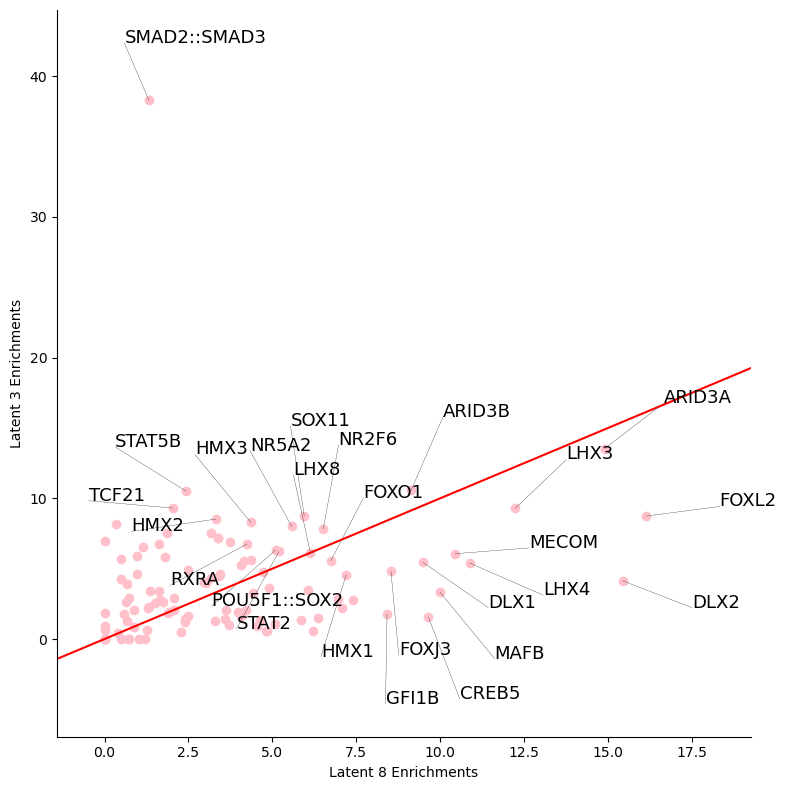

In [23]:
import matplotlib.pyplot as plt
model.plot_compare_topic_enrichments(8, 3, pval_threshold=(1e-10, 1e-11), color="pink")
plt.savefig("figs/Hair/TF_8_3.pdf", dpi=300)

In [16]:
latent_6_tf, index_learnt = model.get_enriched_TFs(atac_data, topic_num=6, top_quantile=1e-5, loadings=loadings, num_exo_features=1e7)
latent_6_tf = pd.DataFrame(latent_6_tf)

Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

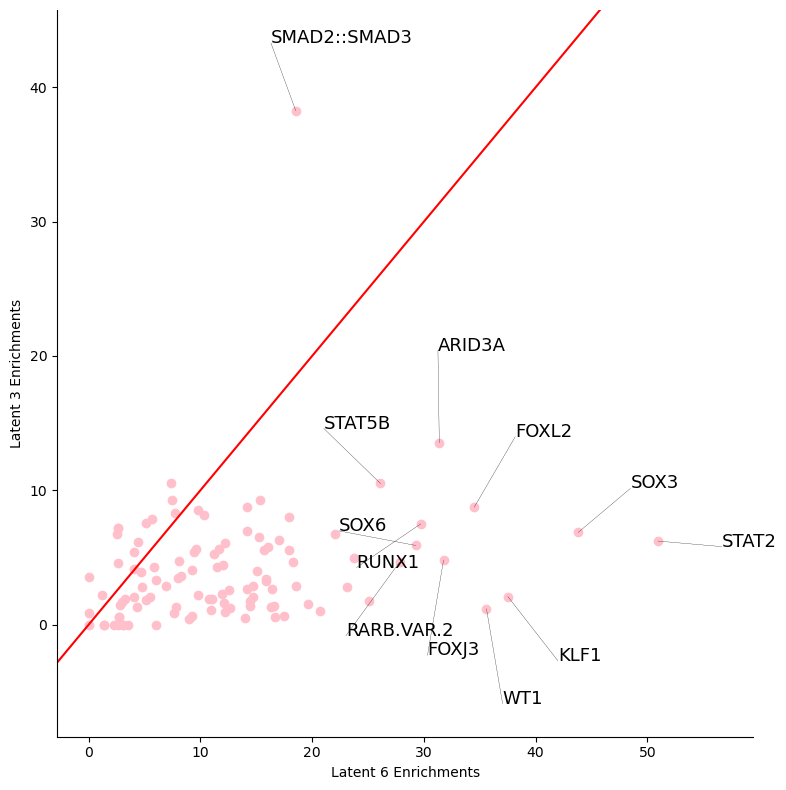

In [24]:
model.plot_compare_topic_enrichments(6, 3, pval_threshold=(1e-30, 1e-30), color="pink")
plt.savefig("figs/Hair/TF_6_3.pdf", dpi=300)

In [23]:
latent_6_tf.sort_values(by=['pval']).head(10)


,id,name,parsed_name,pval,test_statistic
78,MA1623.1,STAT2,STAT2,1.109757e-51,194.550707
42,MA0514.1,SOX3,SOX3,1.553712e-44,188.970499
71,MA0493.1,KLF1,KLF1,3.075088e-38,118.999290
34,MA1627.1,WT1,WT1,2.536222e-36,97.996123
72,MA1607.1,FOXL2,FOXL2,3.138889e-35,218.263617
100,MA0851.1,FOXJ3,FOXJ3,1.742546e-32,192.546196
101,MA0151.1,ARID3A,ARID3A,4.207979e-32,119.283192
79,MA0002.2,RUNX1,RUNX1,1.918217e-30,145.717971
53,MA0515.1,SOX6,SOX6,5.527529e-30,173.378219
4,MA0858.1,RARB.VAR.2,RARB.VAR.2,1.523844e-28,243.241919


In [18]:
latent_4_tf, index_learnt = model.get_enriched_TFs(atac_data, topic_num=4, top_quantile=5e-5, loadings=loadings, num_exo_features=1e6)
latent_4_tf = pd.DataFrame(latent_4_tf)

Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

In [19]:
latent_1_tf, index_learnt = model.get_enriched_TFs(atac_data, topic_num=1, top_quantile=5e-5, loadings=loadings, num_exo_features=1e6)
latent_1_tf = pd.DataFrame(latent_1_tf)

Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

legend label 
axlabel ('Latent 1 Enrichments', 'Latent 8 Enrichments')


<AxesSubplot:xlabel='Latent 1 Enrichments', ylabel='Latent 8 Enrichments'>

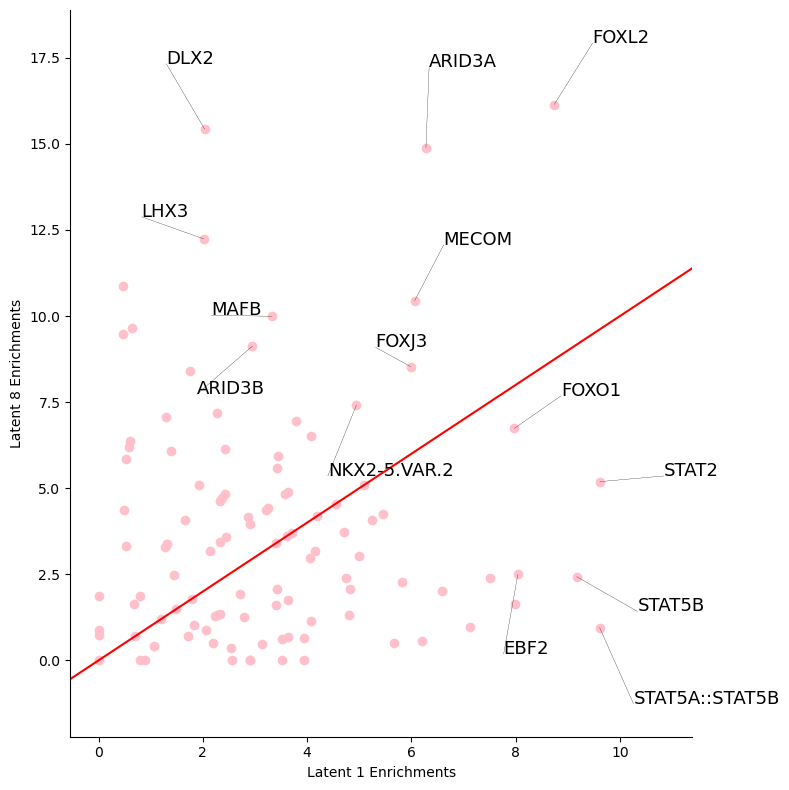

In [21]:
model.plot_compare_topic_enrichments(1, 8, color="pink", pval_threshold=(1e-10, 1e-12))

In [21]:
latent_2_tf, index_learnt = model.get_enriched_TFs(atac_data, topic_num=2, top_quantile=5e-5, loadings=loadings, num_exo_features=1e6)
latent_2_tf = pd.DataFrame(latent_2_tf)
latent_2_tf.sort_values(by=['pval']).head(10)


Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

,id,name,parsed_name,pval,test_statistic
101,MA0151.1,ARID3A,ARID3A,7.983093e-28,46.119926
78,MA1623.1,STAT2,STAT2,8.547902e-20,30.095213
66,MA0879.1,DLX1,DLX1,4.692142e-18,46.872833
19,MA0704.1,LHX4,LHX4,2.721620e-16,41.548921
30,MA0720.1,SHOX2,SHOX2,8.944317e-14,38.416793
79,MA0002.2,RUNX1,RUNX1,1.811611e-13,24.672422
53,MA0515.1,SOX6,SOX6,2.545124e-13,28.448438
38,MA0135.1,LHX3,LHX3,5.796218e-13,32.218200
58,MA0601.1,ARID3B,ARID3B,9.277540e-13,30.816987
42,MA0514.1,SOX3,SOX3,1.566996e-12,20.694161


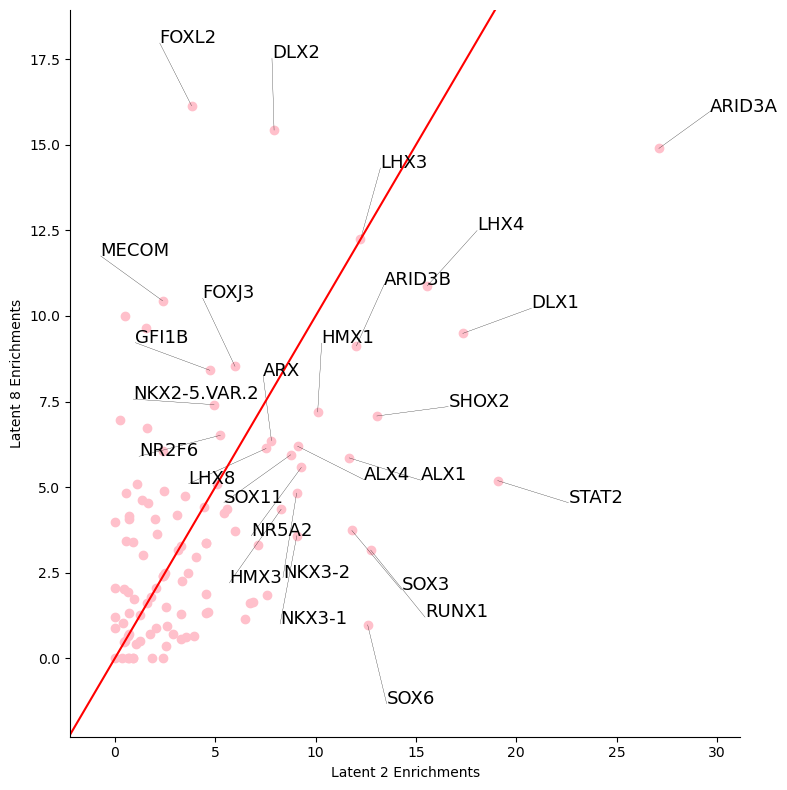

In [22]:
model.plot_compare_topic_enrichments(2, 8, color="pink", pval_threshold=(1e-10, 1e-12))
plt.savefig("figs/Hair/TF_8_2.pdf", dpi=300)

In [13]:
## plot the TF enrichment figures

atac_data =  sc.read_h5ad("data/datasets/mouse_hair_atac_interim.h5ad")


In [19]:
atac_data.uns["TSS_metadata"]

{'chromosome': array(['chr1', 'chr1', 'chr1', ..., 'chrY', 'chrY',
        'chrY_JH584303_random'], dtype=object),
 'gene': array(['4933401J01RIK', 'GM26206', 'GM18956', ..., 'GM21742', 'GM21748',
        'AC234645.1'], dtype=object),
 'strand': array(['+', '+', '+', ..., '+', '-', '+'], dtype=object),
 'txEnd': array([ 3074322,  3102125,  3253236, ..., 90844040, 90839177,    82689]),
 'txStart': array([ 3073252,  3102015,  3252756, ..., 90837412, 90838868,    81606])}

In [35]:
adata_mvi

AnnData object with n_obs × n_vars = 6436 × 113615
    obs: 'atac.bc', 'celltype', 'latent_time', 'batch_id', 'modality', '_scvi_batch', '_scvi_labels'
    var: 'feature_types', 'modality', 'n_cells'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'celltype_colors'
    obsm: 'latent', 'X_umap'
    obsp: 'distances', 'connectivities'

In [37]:
latentname = ["atac_latent_"+str(i) for i in range(10)]


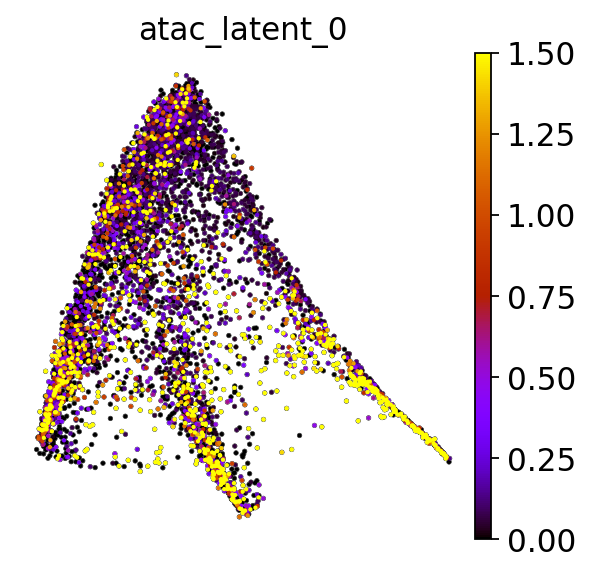

In [41]:
sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,
          outline_width=(0.1,0), color=latentname[0],color_map = 'gnuplot',vmin=0., vmax=1.5,save=save_path)   

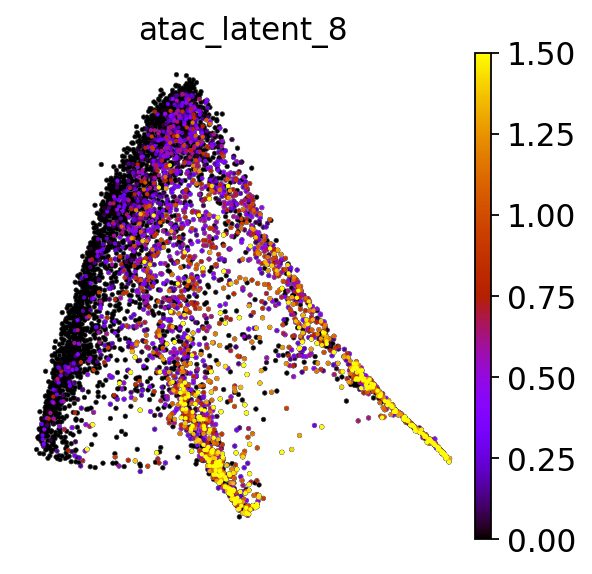

In [43]:
sc.pl.umap(adata_mvi, frameon=False, size = 15, alpha = 1, add_outline=True,
          outline_width=(0.1,0), color=latentname[8],color_map = 'gnuplot',vmin=0, vmax=1.5,save=save_path)

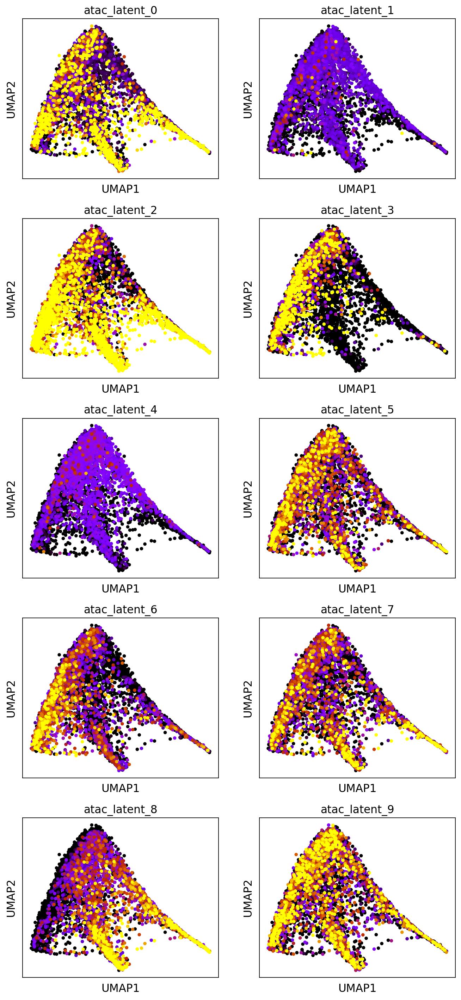

In [50]:
colorlatent = latentname
sc.pl.umap(rna_data, color=colorlatent, ncols=2, size=75, color_map="gnuplot", outline_width=(0, 0.2),
vmin=0,vmax=1.5, colorbar_loc=None) 

Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

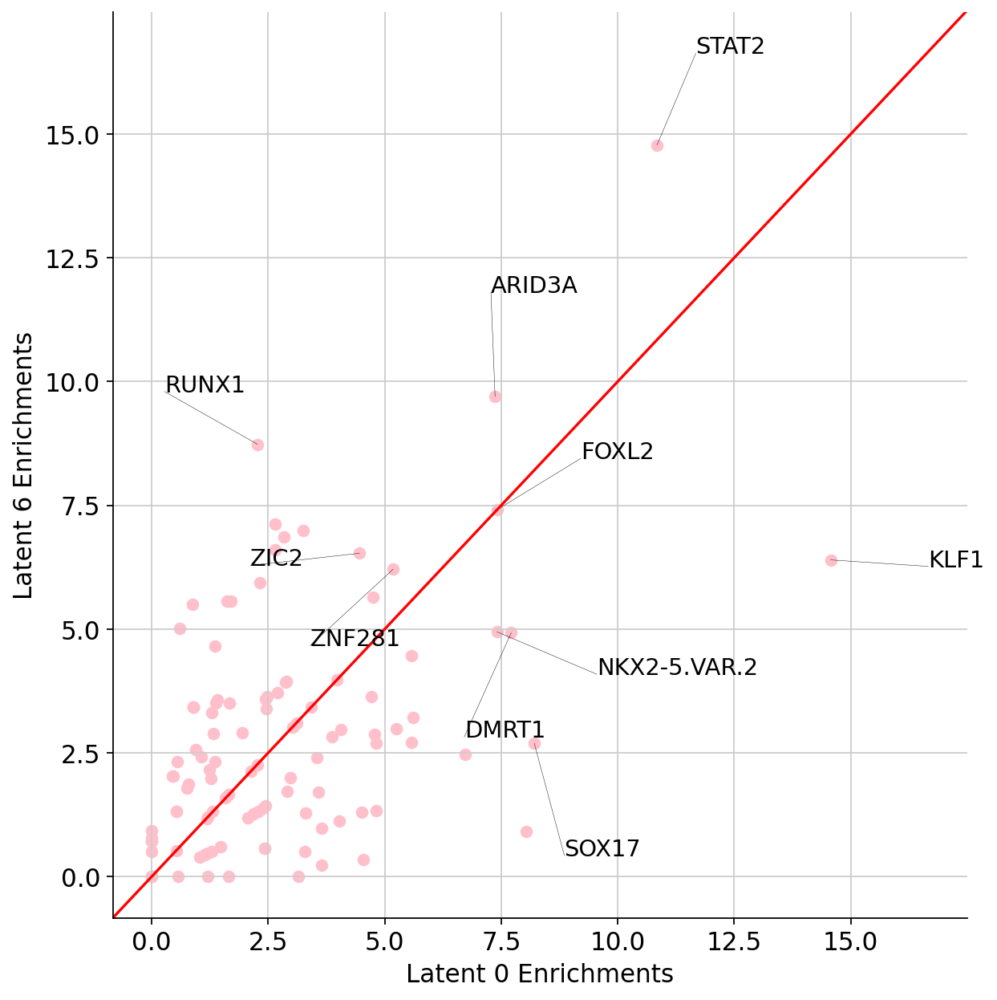

In [48]:
compare_latent_TFs(0,6)

Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

Finding enrichments:   0%|          | 0/107 [00:00<?, ?it/s]

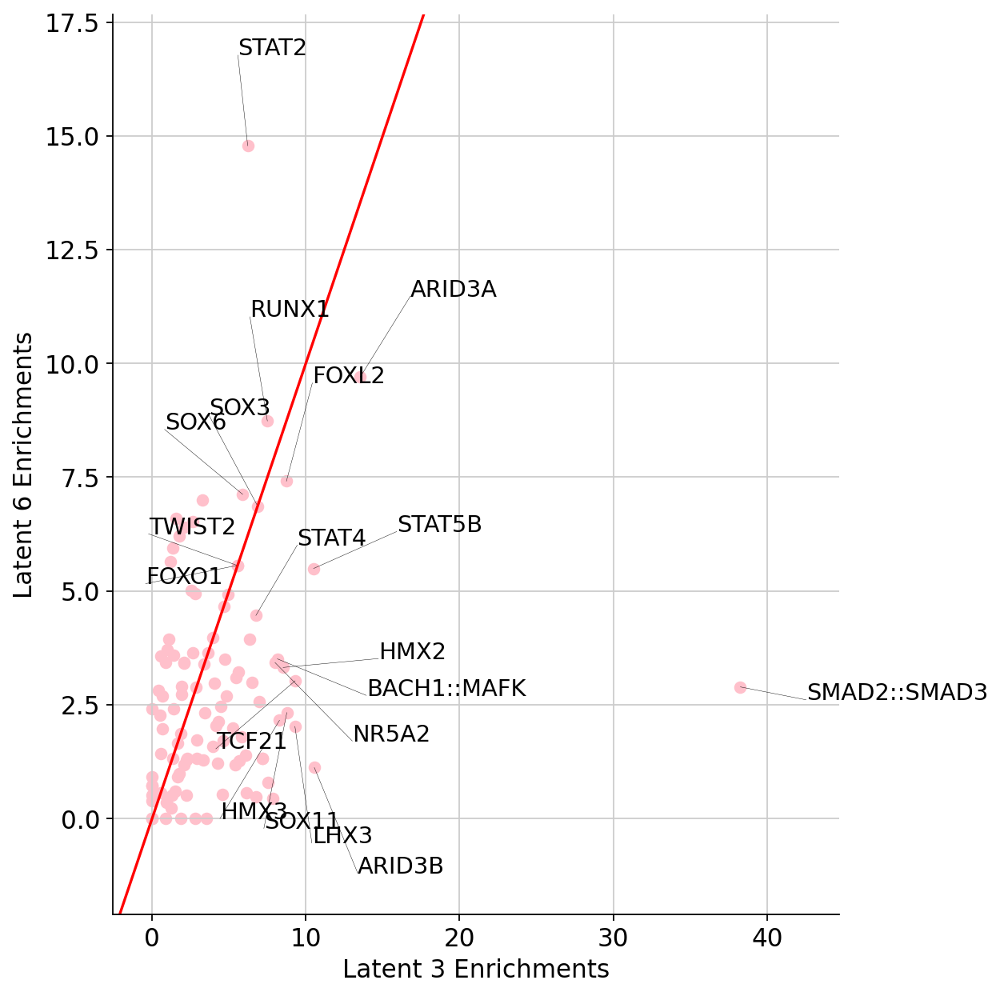

In [49]:
compare_latent_TFs(3,6)